In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 9.9 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=0752443f5d6f71d46dd252a0f835947aad217ad2b31b1f2514c75ada3cece84e
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.11 ; cuda:  cu113
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu113/torch1.11/index.html
ERROR: Could not find a version that satisfies the requirement detectron2 (from versions: none)
ERROR: No matching distribution found for detectron2


In [ ]:
!git clone https://github.com/facebookresearch/detectron2.git
!pip install -e detectron2

fatal: destination path 'detectron2' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2
  Attempting uninstall: detectron2
    Found existing installation: detectron2 0.6
    Can't uninstall 'detectron2'. No files were found to uninstall.
  Running setup.py develop for detectron2


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("experimenty", {}, "/content/drive/MyDrive/stuff/finalll.json", "/content/drive/MyDrive/stuff/images")

In [ ]:
from detectron2.data import MetadataCatalog
MetadataCatalog.get("experimenty").thing_classes = ["titulus"]
experiment_metadata = MetadataCatalog.get("experimenty")
dataset_dicts = DatasetCatalog.get("experimenty")

[06/15 16:55:03 d2.data.datasets.coco]: Loaded 47 images in COCO format from /content/drive/MyDrive/stuff/finalll.json


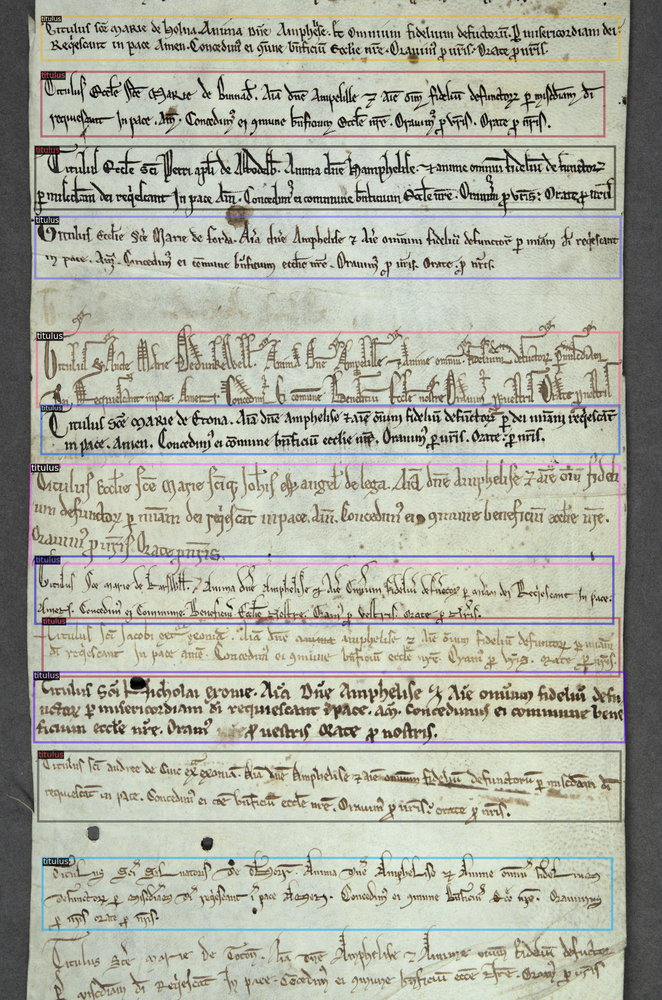

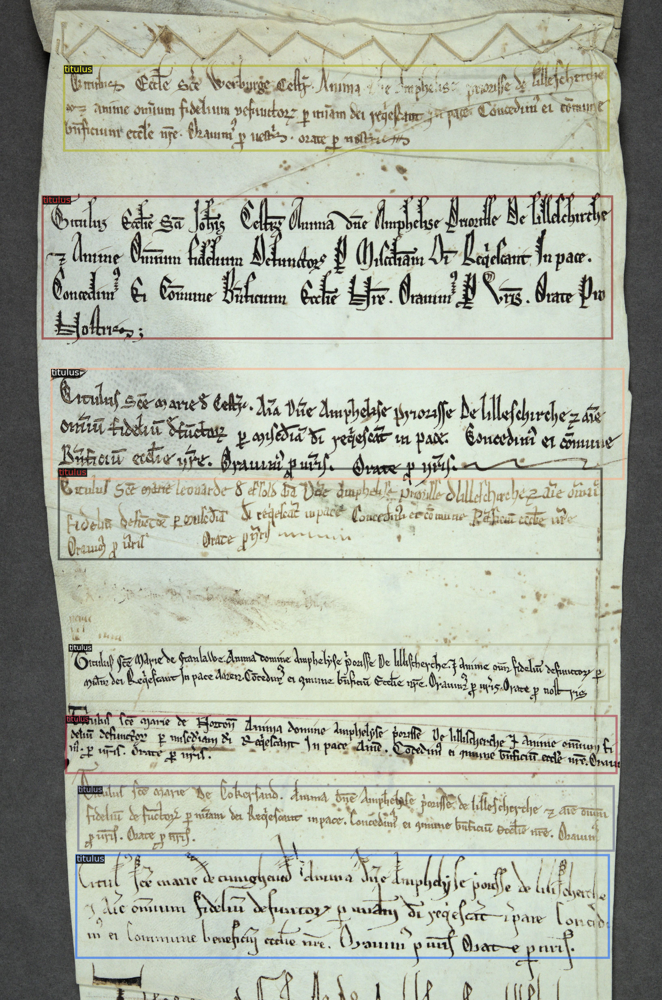

In [ ]:
import random

for d in random.sample(dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=experiment_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 14382, done.
remote: Counting objects: 100% (155/155), done.
remote: Compressing objects: 100% (117/117), done.
remote: Total 14382 (delta 51), reused 114 (delta 37), pack-reused 14227
Receiving objects: 100% (14382/14382), 5.97 MiB | 4.25 MiB/s, done.
Resolving deltas: 100% (10352/10352), done.


In [ ]:
import torch
print(torch.version)
print(torch.cuda.is_available())

<module 'torch.version' from '/usr/local/lib/python3.7/dist-packages/torch/version.py'>
True


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_DC5_1x.yaml"))
cfg.DATASETS.TRAIN = ("experimenty")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_DC5_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 5000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/15 16:57:24 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_51d356.pkl: 663MB [00:42, 15.5MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[06/15 16:58:13 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[06/15 16:58:52 d2.utils.events]:  eta: 2:36:07  iter: 19  total_loss: 3.84  loss_cls: 0.728  loss_box_reg: 0.5767  loss_rpn_cls: 2.093  loss_rpn_loc: 0.4792  time: 1.8580  data_time: 1.2246  lr: 4.9953e-06  max_mem: 4078M


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("experimenty", )
predictor = DefaultPredictor(cfg)

[06/12 14:45:51 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                        | Shapes                                          |
|:------------------------------------------------|:-------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weight,w

In [ ]:
register_coco_instances("test", {}, "/content/drive/MyDrive/stuff/test.json", "/content/drive/MyDrive/stuff/imm")
test_metadata = MetadataCatalog.get("test")
dataset_test = DatasetCatalog.get("test")

[06/12 14:45:55 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/drive/MyDrive/stuff/test.json


In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in dataset_test:    
    im = cv2.imread(d["file_name"])
    splits = d["file_name"].split('/');
    filename = d["file_name"]
    print(filename)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=experiment_metadata, 
                   scale=0.5, 
                   # instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    
    
    scores = (outputs["instances"].scores).tolist()
    i = 0;
    for box in outputs["instances"].pred_boxes.to('cpu'):
      if (scores[i] > 0.8):
        v.draw_box(box)
      i = i + 1;

    #out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    v = v.get_output()
    img =  v.get_image()[:, :, ::-1]
    #cv2_imshow(img)
    cv2.imwrite('/content/drive/MyDrive/NewFolder/' + filename, img)    


/content/drive/MyDrive/stuff/imm/Lucy-01.png
/content/drive/MyDrive/stuff/imm/Lucy-02.png
/content/drive/MyDrive/stuff/imm/Lucy-03.png
/content/drive/MyDrive/stuff/imm/Lucy-04.png
/content/drive/MyDrive/stuff/imm/Lucy-05.png
/content/drive/MyDrive/stuff/imm/Lucy-06.png
/content/drive/MyDrive/stuff/imm/Lucy-07.png
/content/drive/MyDrive/stuff/imm/Lucy-08.png
/content/drive/MyDrive/stuff/imm/Lucy-09.png
/content/drive/MyDrive/stuff/imm/Lucy-10.png


In [ ]:
import csv
i = 0;
w = csv.writer(open("new.csv", "w"))
header = ["instances", "x1", "y1", "x2", "y2", "page", "accuracy"]
w.writerow(header)

for d in dataset_test:
    im = cv2.imread(d["file_name"])
    splits = d["file_name"].split('/');
    filename = splits[6]
    print(filename)
    outputs = predictor(im)    
    scores = (outputs["instances"].scores).tolist()
    happy = (outputs["instances"].pred_boxes)
    z = 0;
    for score in scores:
      if (score > 0.8):
        b = str(happy[z])
        final = b[16: len(b) -21]
        x1, y1, x2, y2 = final.split(',')
        i = i + 1
        data = ["titulus" + str(i), float(x1), float(y1), float(x2), float(y2), filename, scores[z]]
        w.writerow(data)
      z = z + 1
    



Lucy-01.png
Lucy-02.png
Lucy-03.png
Lucy-04.png
Lucy-05.png
Lucy-06.png
Lucy-07.png
Lucy-08.png
Lucy-09.png
Lucy-10.png
